**Goals:**  
1. Understand how our partnership is impacting enrollment trends, course grades, and course exams.  
2. Show the overall trends of course grades among the advanced courses offered at their school.  

**Limits:**  
1. Missing control variables. e.g. whether the same test is used for all students.  
2. Missing repeated measurement data. e.g. numeric grade sampled at different timestamps from the same student/school.  
3. Current models lack predicting power.

**Hypotheses:**  
1. Significant difference in AP course grades between students of different status.  
2. Significant difference in AP course grades between First-time takers and Experienced takers.  
3. Student's AP course grade increases as partnership time increases.  
4. Average difference in AP course grade decreases between students of different status as partnership time increases.  
5. Odds of student passing AP course increases as partnership time increases.  

In [90]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels.formula.api as smf
import plotly.graph_objects as go
df = pd.read_csv(r"D:\Allen Archive\Allen Archives\NEU_academics\Experience Expo\Grade Analysis Report Data_Grade Analysis Report Data.csv")

In [57]:
"""
Select variables of interest.
"""
vars = ["gender", "a. ur_student", "ur_student", "segment_text", "a. firsttime_enrollment",  # demographic 
        "numeric_grade", "letter_grade_group", "passing_flag", "course_ulc",                 # grade and course info
        "grade_level", "schoolid",                                                           # school related info
        "school_years_active",                                                               # number of years of partnership
        "c. School Year (label)"]                                                            # school year (when the data was collected?)
data = df[vars]

In [58]:
"""
Additional data refinement.
"""
data = data[data["course_ulc"] == "AP"] # Select data corresponding to AP courses
data = data.dropna()                    # Remove NAs

In [68]:
"""
Descriptive plots.
"""
# Numeric grade distribution
numeric_grades = data["numeric_grade"]
fig1 = px.histogram(data, x="numeric_grade", nbins=5, title="Numeric Grade Distribution")
fig1.update_traces(marker=dict(line=dict(color='black', width=1)), opacity=0.5)
fig1.update_layout(xaxis_title="Numeric Grade",yaxis_title="Frequency")
fig1.show()

# Letter grade distribution
cnt_letter_grade = data["letter_grade_group"].value_counts(normalize=True)
fig2 = px.bar(cnt_letter_grade, x=cnt_letter_grade.index, y=cnt_letter_grade.values, title="Letter Grade Distribution")
fig2.update_traces(marker=dict(line=dict(color='black', width=1)), opacity=0.5)
fig2.update_layout(xaxis_title="Letter Grade", yaxis_title="Frequency")
fig2.show()

# Student passing flag distribution
cnt_passing_flag = data["passing_flag"].value_counts(normalize=True)
fig3 = px.bar(cnt_passing_flag, x=cnt_passing_flag.index, y=cnt_passing_flag.values, title="Student Passing Flag Distribution")
fig3.update_traces(marker=dict(line=dict(color='black', width=1)), opacity=0.5)
fig3.update_layout(xaxis_title="Passing Flag", yaxis_title="Frequency")
fig3.show()

# Student status distribution
cnt_student_status = data["a. ur_student"].value_counts(normalize=True)
fig4 = px.bar(cnt_student_status, x=cnt_student_status.index, y=cnt_student_status.values, title="Student Status Distribution")
fig4.update_traces(marker=dict(line=dict(color='black', width=1)), opacity=0.5)
fig4.update_layout(xaxis_title="Student Status", yaxis_title="Frequency")
fig4.show()

# Partnership duration distribution
fig5 = px.histogram(data, x="school_years_active", nbins=10, title="Partnership Duration Distribution (Years)")
fig5.update_traces(marker=dict(line=dict(color='black', width=1)), opacity=0.5)
fig5.update_layout(xaxis_title="Partnership Duration (Years)",yaxis_title="Frequency")
fig5.show()

***Hypothesis 1: Significant difference in AP course grades between students of different status.***

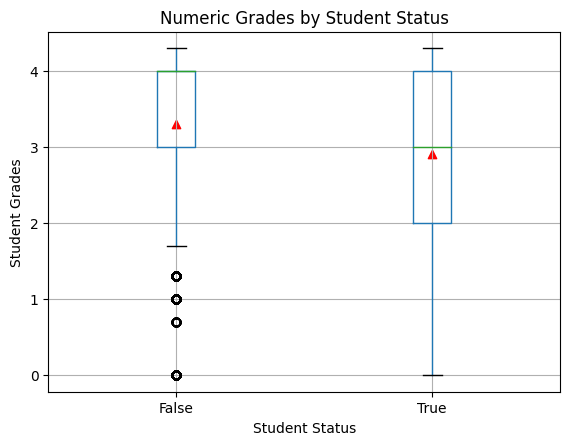

In [92]:
# Box plot (skewed distribution for the numeric grade of students of "Med/High-Income White & Asian Students")
means = data.groupby("ur_student")["numeric_grade"].mean()
data.boxplot(column="numeric_grade", by="ur_student")
plt.xlabel("Student Status")
plt.ylabel("Student Grades")
plt.suptitle("")
plt.title("Numeric Grades by Student Status")
plt.scatter([1, 2], means, marker='^', color="red")
plt.show()

In [15]:
# Linear model 1.0 (baseline model)
m0 = smf.ols(formula="numeric_grade ~ 1", data=data)
res0 = m0.fit()
print(res0.summary())

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Mon, 22 Jul 2024   Prob (F-statistic):                nan
Time:                        20:00:05   Log-Likelihood:            -1.0784e+05
No. Observations:               74696   AIC:                         2.157e+05
Df Residuals:                   74695   BIC:                         2.157e+05
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1438      0.004    838.128      0.0

In [16]:
# Linear model 1.1
m1 = smf.ols(formula="numeric_grade ~ ur_student", data=data)
res1 = m1.fit()
print(res1.summary())
"""
The coefficient of ur_student in model 1 is statistically significant (p < 0.001), providing evidence to support hypothesis 1.
"""

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.036
Method:                 Least Squares   F-statistic:                     2765.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        20:00:06   Log-Likelihood:            -1.0649e+05
No. Observations:               74696   AIC:                         2.130e+05
Df Residuals:                   74694   BIC:                         2.130e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              3.3051      0

'\nThe coefficient of ur_student in model 1 is statistically significant (p < 0.001), providing evidence to support hypothesis 1.\n'

***Hypothesis 2: Significant difference in AP course grades between First-time takers and Experienced takers.***

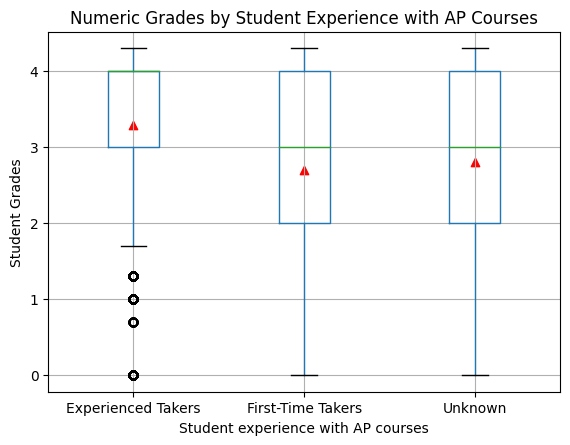

In [93]:
# Box plot 
means = data.groupby("a. firsttime_enrollment")["numeric_grade"].mean()
data.boxplot(column="numeric_grade", by="a. firsttime_enrollment")
plt.xlabel("Student experience with AP courses")
plt.ylabel("Student Grades")
plt.suptitle("")
plt.title("Numeric Grades by Student Experience with AP Courses")
plt.scatter([1, 2, 3], means, marker='^', color="red")
plt.show()

In [18]:
# Linear model 2.0 (baseline model)
m0 = smf.ols(formula="numeric_grade ~ 1", data=data)
res0 = m0.fit()
print(res0.summary())

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Mon, 22 Jul 2024   Prob (F-statistic):                nan
Time:                        20:00:07   Log-Likelihood:            -1.0784e+05
No. Observations:               74696   AIC:                         2.157e+05
Df Residuals:                   74695   BIC:                         2.157e+05
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1438      0.004    838.128      0.0

In [19]:
# Linear model 2.1
experience = data["a. firsttime_enrollment"]
m1 = smf.ols(formula="numeric_grade ~ experience", data=data)
res1 = m1.fit()
print(res1.summary())
"""
The coefficient of experience(First-Time Takers and Unknown) in model 1 is statistically significant (p < 0.001),
meaning on average, the numeric grade of students of these two categories is significantly lower than that of the
Experienced Eakers. This evidence supports hypothesis 2.
"""

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     2295.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        20:00:08   Log-Likelihood:            -1.0562e+05
No. Observations:               74696   AIC:                         2.112e+05
Df Residuals:                   74693   BIC:                         2.113e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

'\nThe coefficient of experience(First-Time Takers and Unknown) in model 1 is statistically significant (p < 0.001),\nmeaning on average, the numeric grade of students of these two categories is significantly lower than that of the\nExperienced Eakers. This evidence supports hypothesis 2.\n'

***Hypothesis 3: Student's AP course grade increases as partnership time increases.***

In [105]:
# Create a scatter plot with Plotly
fig = px.scatter(
    data,
    x="school_years_active",
    y="numeric_grade",
    trendline="ols",
    title="Change in numeric_grade with respect to school_years_active",
    labels={"school_years_active": "Partnership Time (Years)", "numeric_grade": "Numeric Grade"},
    template="plotly_white"
)

# Update the trendline color to red
fig.update_traces(line=dict(color='red'), selector=dict(type='scatter', mode='lines'))

# Show the plot
fig.show()

In [106]:
# Scatter plot using Matplotlib

# plt.scatter(data["school_years_active"], data["numeric_grade"])
# plt.xlabel("school_years_active")
# plt.ylabel("numeric_grade")
# plt.title("Change in numeric_grade with respect to school_years_active")

# # fitting linear model for plot
# coef = np.polyfit(x=data["school_years_active"], y=data["numeric_grade"], deg=1)
# model = np.poly1d(coef) 
# y_hat = model(data["school_years_active"])
# plt.plot(data["school_years_active"], y_hat, color='red', label='Fit')

# plt.legend()
# plt.show()

In [21]:
# Linear model 3.0 (baseline model)
m0 = smf.ols(formula="numeric_grade ~ 1", data=data)
res0 = m0.fit()
print(res0.summary())

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Mon, 22 Jul 2024   Prob (F-statistic):                nan
Time:                        20:00:09   Log-Likelihood:            -1.0784e+05
No. Observations:               74696   AIC:                         2.157e+05
Df Residuals:                   74695   BIC:                         2.157e+05
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1438      0.004    838.128      0.0

In [22]:
# Linear model 3.1
m1 = smf.ols(formula="numeric_grade ~ school_years_active", data=data)
res1 = m1.fit()
print(res1.summary())
"""
The coefficient of school_years_active in model 1 is statistically significant (p < 0.001), providing evidence to support hypothesis 3.
"""

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     71.45
Date:                Mon, 22 Jul 2024   Prob (F-statistic):           2.90e-17
Time:                        20:00:10   Log-Likelihood:            -1.0781e+05
No. Observations:               74696   AIC:                         2.156e+05
Df Residuals:                   74694   BIC:                         2.156e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               3.0528    

'\nThe coefficient of school_years_active in model 1 is statistically significant (p < 0.001), providing evidence to support hypothesis 3.\n'

***Hypothesis 4: Average difference in AP course grade decreases between students of different status as partnership time increases.***

In [119]:
# Create a scatter plot with Plotly
fig = go.Figure()

# Add scatter points
fig.add_trace(go.Scatter(
    x=data["school_years_active"],
    y=data["numeric_grade"],
    mode='markers',
    marker=dict(color=data["ur_student"]),
    name='Data Points'
))

# Fitting linear model for plot (ur_student == False)
temp_false = data[data["ur_student"] == False]
coef_false = np.polyfit(x=temp_false["school_years_active"], y=temp_false["numeric_grade"], deg=1)
model_false = np.poly1d(coef_false)
y_hat_false = model_false(data["school_years_active"])

# Add linear fit line (ur_student == False)
fig.add_trace(go.Scatter(
    x=data["school_years_active"],
    y=y_hat_false,
    mode='lines',
    line=dict(color='yellow'),
    name='Fit (ur_student == False)',
    hoverinfo='x+y',
    hovertemplate='Partnership Time: %{x}<br>Numeric Grade: %{y}'
))

# Fitting linear model for plot (ur_student == True)
temp_true = data[data["ur_student"] == True]
coef_true = np.polyfit(x=temp_true["school_years_active"], y=temp_true["numeric_grade"], deg=1)
model_true = np.poly1d(coef_true)
y_hat_true = model_true(data["school_years_active"])

# Add linear fit line (ur_student == True)
fig.add_trace(go.Scatter(
    x=data["school_years_active"],
    y=y_hat_true,
    mode='lines',
    line=dict(color='purple'),
    name='Fit (ur_student == True)',
    hoverinfo='x+y',
    hovertemplate='Partnership Time: %{x}<br>Numeric Grade: %{y}'
))

# Update layout
fig.update_layout(
    title="Change in numeric_grade with respect to school_years_active",
    xaxis_title="Partnership Time (Years)",
    yaxis_title="Numeric Grade",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()

In [120]:
# Matplotlib Scatter plot
# plt.scatter(data["school_years_active"], data["numeric_grade"], c=data["ur_student"])
# plt.xlabel("school_years_active")
# plt.ylabel("numeric_grade")
# plt.title("Change in numeric_grade with respect to school_years_active")

# # fitting linear model for plot (ur_student == False)
# temp = data[data["ur_student"] == False]
# coef = np.polyfit(x=temp["school_years_active"], y=temp["numeric_grade"], deg=1)
# model = np.poly1d(coef) 
# y_hat = model(data["school_years_active"])
# plt.plot(data["school_years_active"], y_hat, color='yellow', label='Fit')

# # fitting linear model for plot (ur_student == True)
# temp = data[data["ur_student"] == True]
# coef = np.polyfit(x=temp["school_years_active"], y=temp["numeric_grade"], deg=1)
# model = np.poly1d(coef) 
# y_hat = model(data["school_years_active"])
# plt.plot(data["school_years_active"], y_hat, color='purple', label='Fit')

# plt.legend()
# plt.show()

In [24]:
# Linear model 4.0 (baseline model)
m0 = smf.ols(formula="numeric_grade ~ 1", data=data)
res0 = m0.fit()
print(res0.summary())

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                       nan
Date:                Mon, 22 Jul 2024   Prob (F-statistic):                nan
Time:                        20:00:16   Log-Likelihood:            -1.0784e+05
No. Observations:               74696   AIC:                         2.157e+05
Df Residuals:                   74695   BIC:                         2.157e+05
Df Model:                           0                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.1438      0.004    838.128      0.0

In [25]:
# Linear model 4.1
m1 = smf.ols(formula="numeric_grade ~ ur_student + school_years_active", data=data)
res1 = m1.fit()
print(res1.summary())
"""
Model 4.1 shows that both student status and partnership duration have significant impact on the academic performance of the student.
Compared with partnership duration, the student status has a stronger impact on student performance.
"""

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.037
Method:                 Least Squares   F-statistic:                     1456.
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        20:00:16   Log-Likelihood:            -1.0642e+05
No. Observations:               74696   AIC:                         2.128e+05
Df Residuals:                   74693   BIC:                         2.129e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
Intercept               3.1817    

'\nModel 4.1 shows that both student status and partnership duration have significant impact on the academic performance of the student.\nCompared with partnership duration, the student status has a stronger impact on student performance.\n'

In [26]:
# Linear model 4.2
m1 = smf.ols(formula="numeric_grade ~ ur_student + school_years_active + ur_student : school_years_active", data=data)
res1 = m1.fit()
print(res1.summary())
"""
Modele 4.2 shows that the interaction term's coefficient is significant (p < 0.001), which provides evidence of a significant
moderation effect by partnership duration.
The academic performace of students of group "Students of Color & Low-Income Students" is on average 0.5425 lower than
that of the students of group "Med/High-Income White & Asian Students" when contolling for other variables.
The variable school_years_active significantly moderates the relation between ur_student and numeric_grade. Each year
of partnership reduces the difference mentioned above by 0.0244.
"""

                            OLS Regression Results                            
Dep. Variable:          numeric_grade   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     985.3
Date:                Mon, 22 Jul 2024   Prob (F-statistic):               0.00
Time:                        20:00:16   Log-Likelihood:            -1.0639e+05
No. Observations:               74696   AIC:                         2.128e+05
Df Residuals:                   74692   BIC:                         2.128e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

'\nModele 4.2 shows that the interaction term\'s coefficient is significant (p < 0.001), which provides evidence of a significant\nmoderation effect by partnership duration.\nThe academic performace of students of group "Students of Color & Low-Income Students" is on average 0.5425 lower than\nthat of the students of group "Med/High-Income White & Asian Students" when contolling for other variables.\nThe variable school_years_active significantly moderates the relation between ur_student and numeric_grade. Each year\nof partnership reduces the difference mentioned above by 0.0244.\n'

***Hypothesis 5: Average odds of student passing AP course increases between students of different status as partnership time increases.***

In [27]:
temp = data
temp["passing_flag"] = temp["passing_flag"].map({"Yes":1, "No":0})

In [28]:
# Linear model 5.0 (baseline model)
m0 = smf.logit(formula='passing_flag ~ 1', data=temp)
res0 = m0.fit()
print(res0.summary())

Optimization terminated successfully.
         Current function value: 0.304866
         Iterations 6
                           Logit Regression Results                           
Dep. Variable:           passing_flag   No. Observations:                74696
Model:                          Logit   Df Residuals:                    74695
Method:                           MLE   Df Model:                            0
Date:                Mon, 22 Jul 2024   Pseudo R-squ.:               1.327e-12
Time:                        20:00:20   Log-Likelihood:                -22772.
converged:                       True   LL-Null:                       -22772.
Covariance Type:            nonrobust   LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.3014      0.013    180.908      0.000       2.276       2.326


In [29]:
# Linear model 5.1
m1 = smf.logit(formula='passing_flag ~ ur_student + school_years_active + ur_student : school_years_active', data=temp)
res1 = m1.fit()
print(res1.summary())
"""
Model 5.1 shows that the interaction term's coefficient is significant (p < 0.001), which provides evidence of a significant moderation effect
by partnership duration.
When controlling for other variables, the odds of passing AP courses for students from group "Students of Color & Low-Income Students" are,
on average, approximately 31.75% (or 0.3175 times) of the odds for individuals from group "Med/High-Income White & Asian Students".
The variable school_years_active significantly moderates the relationship between ur_student and passing_flag. For each unit increase in 
school_years_active, the odds of passing AP courses for students from group "Students of Color & Low-Income Students" increase by approximately
8.88% (or 1.0888 times). 
"""

Optimization terminated successfully.
         Current function value: 0.299480
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:           passing_flag   No. Observations:                74696
Model:                          Logit   Df Residuals:                    74692
Method:                           MLE   Df Model:                            3
Date:                Mon, 22 Jul 2024   Pseudo R-squ.:                 0.01767
Time:                        20:00:21   Log-Likelihood:                -22370.
converged:                       True   LL-Null:                       -22772.
Covariance Type:            nonrobust   LLR p-value:                4.228e-174
                                             coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------
Intercept                                  2.4667   

'\nModel 5.1 shows that the interaction term\'s coefficient is significant (p < 0.001), which provides evidence of a significant moderation effect\nby partnership duration.\nWhen controlling for other variables, the odds of passing AP courses for students from group "Students of Color & Low-Income Students" are,\non average, approximately 31.75% (or 0.3175 times) of the odds for individuals from group "Med/High-Income White & Asian Students".\nThe variable school_years_active significantly moderates the relationship between ur_student and passing_flag. For each unit increase in \nschool_years_active, the odds of passing AP courses for students from group "Students of Color & Low-Income Students" increase by approximately\n8.88% (or 1.0888 times). \n'